# Bootstrapped outlier detection for CTD-χpod

What is "GE"?

1. Pick a bin size
1. In a bin we throw out top 0.6% of estimates.
1. How do we determine that 0.6% threshold?
   1. If we assume χ is  lognormally distributed, this corresponds to
   1. Assume sample mean, sample std are good estimate of the population mean, population std
   1. Anything greater than (sample mean) + 2.698 * (sample std) is an outlier

A bootstrap-based parametric way would be

1. For each resampling of the data, find which threshold value marks the top 0.7% estimate i.e. 0.7% of the data is above this threshold.
1. Do N resamplings so we get N estimates of the threshold.
1. Somehow collapse those N estimates to one value that we use to flag the data.

We can also bootstrap the GE thing by using bootstrap estimates of `mean +  2.698*std`

In [1]:
import hvplot.xarray
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import tqdm.notebook
from arch.bootstrap import IIDBootstrap
from scipy.stats import bootstrap, distributions, lognorm, norm

plt.rcParams["figure.dpi"] = 120
plt.style.use("seaborn")

## Idealized dataset

### Generate some data

Assume 50m bin at 0.5m resolution

(array([ 1.,  9., 18., 25., 28., 13.,  1.,  1.,  1.,  3.]),
 array([-9.17861925, -8.59086032, -8.0031014 , -7.41534247, -6.82758355,
        -6.23982462, -5.6520657 , -5.06430677, -4.47654785, -3.88878892,
        -3.30103   ]),
 <BarContainer object of 10 artists>)

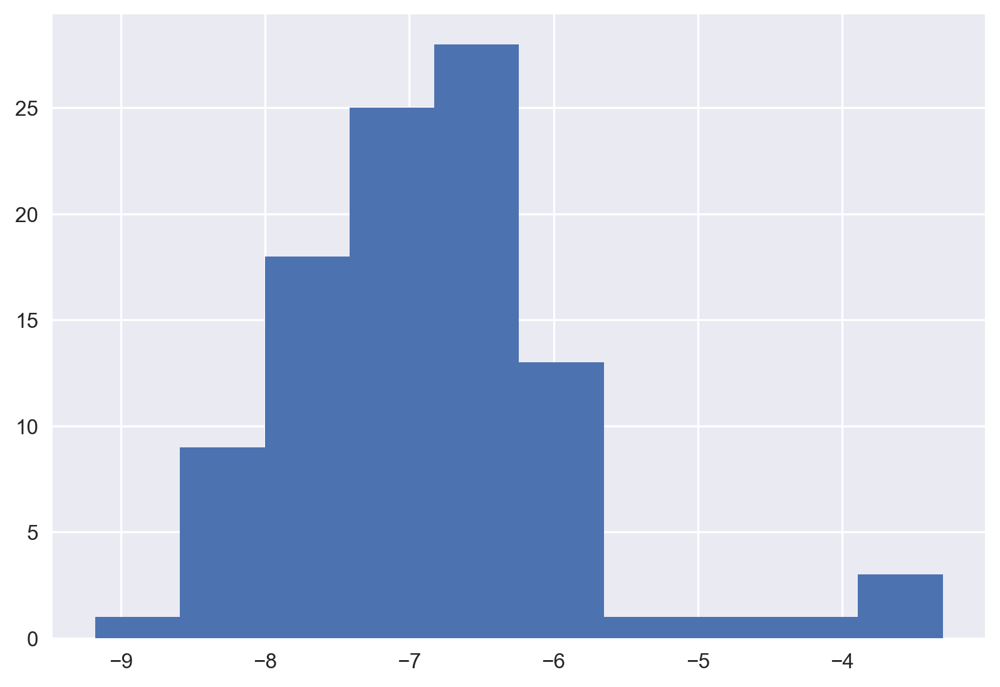

In [2]:
N = int(50 / 0.5)
Nbad = 5

rng = np.random.default_rng()
dist = lognorm(s=2, loc=0, scale=np.exp(1e-10))
data = 1e-10 + 1e-7 * dist.rvs(size=N, random_state=rng)

# assign some outliers
idxbad = np.random.randint(0, N - 1, Nbad)
data[idxbad] = np.arange(1, Nbad + 1) * 1e-4

plt.hist(np.log10(data))

Use the cdf to check the `2.698` threhsold. Looks like 0.6%

In [3]:
(1 - dist.cdf(dist.mean() + 2.698 * dist.std())) * 100

0.5929244418601542

### Write a function that chooses outliers

In [27]:
def topk_thresh(array, thresh=0.6):
    """
    Picks value corresponding to top `thresh`% of samples.

    Effectively this is the lowest of the top `thresh`% of values.
    """

    array = array[~np.isnan(array)]
    N = len(array)
    Nthresh = int(np.ceil(thresh / 100 * N)) + 1

    if Nthresh == 1:
        raise ValueError(
            f"Looking for top N=1 point, threshold of {thresh*100}% seems low."
        )

    # sort the data and pick Nthresh-point from the high end
    return np.sort(array)[-Nthresh]


def ge_lognorm(array):
    """Assumes lognormal distribution and computes mean + 2.698*std as threshold."""
    array = array[~np.isnan(array)]
    return array.mean() + 2.698 * array.std()

### Bootstrap samples of the threshold

#### v1: Use scipy bootstrap

This one calculates a confidence interval but that doesn't seem so useful.

In [5]:
bootstrap(
    (data,),
    topk_thresh,
    n_resamples=1000,
    vectorized=False,
)

BootstrapResult(confidence_interval=ConfidenceInterval(low=2.8039623815065367e-06, high=0.0005), standard_error=0.00016452270006917774)

#### v2: Just generate samples of the threshold

This way we apply the function `topk_thresh` to `reps` number of resamplings of `data`. This yields `reps` estimates of the threshold

In [6]:
boot = IIDBootstrap(data)
thresh_estimates = boot.apply(topk_thresh, reps=1000).squeeze()
with np.printoptions(threshold=100):
    print(thresh_estimates)

[0.0004 0.0005 0.0005 ... 0.0005 0.0005 0.0002]


Histogram of those threshold estimates

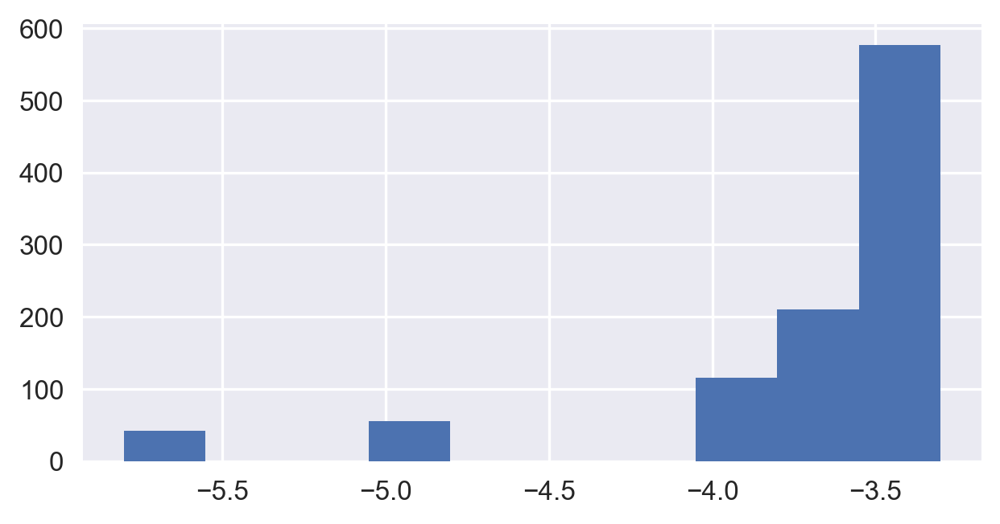

In [7]:
plt.hist(np.log10(thresh_estimates))
plt.gcf().set_size_inches((6, 3))

### Final threshold

We need to pick one value from all bootstrapped estimates.
Given 1000 estimates of the threshold lets pick one

In [8]:
median = np.median(thresh_estimates)
median

0.0004

In [9]:
top5 = np.sort(thresh_estimates)[-int(np.ceil(5 / 100 * len(thresh_estimates)))]
top5

0.0005

In [10]:
top20 = np.sort(thresh_estimates)[-int(np.ceil(20 / 100 * len(thresh_estimates)))]
top20

0.0005

In [11]:
ge_thresh = data.mean() + 2.796 * data.std()
ge_thresh

0.00019887193406118779

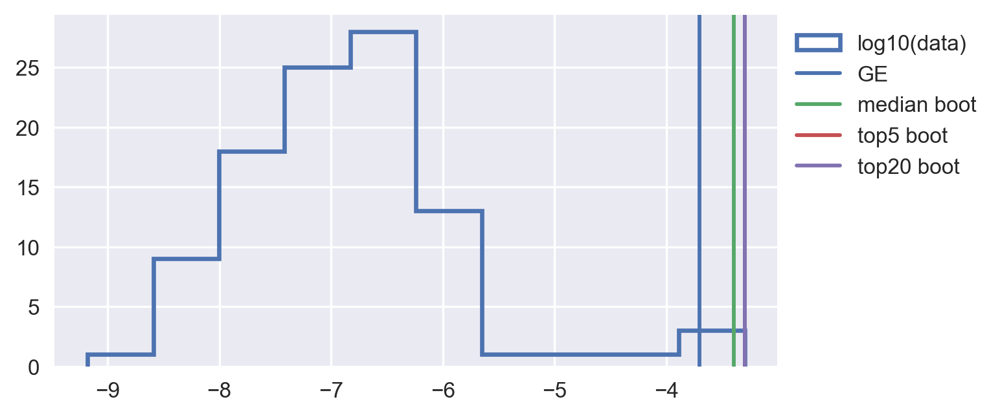

In [12]:
plt.hist(np.log10(data), label="log10(data)", histtype="step", lw=2)
for line, color, label in zip(
    [ge_thresh, median, top5, top20],
    ["C0", "C1", "C2", "C3"],
    ["GE", "median boot", "top5 boot", "top20 boot"],
):
    plt.axvline(np.log10(line), color=color, label=label)
plt.legend(bbox_to_anchor=(1, 1))
plt.gcf().set_size_inches((6, 3))

## CTD-χpod data

### Read data

In [13]:
import cf_xarray
from scipy.io import loadmat

import xarray as xr

In [14]:
mat = loadmat("../datasets/ctd-chipod/scratch/P06_eps_comp_ptoffsetv6.mat")["test7"][
    0, 0
]
mat.dtype.names

('cast',
 'SN',
 'count',
 'T1_xpod',
 'T1_ctd',
 'Tz1_xpod',
 'Tz1_ctd',
 'N21_xpod',
 'N21_ctd',
 'TPvar1',
 'Po1',
 'datenum1',
 'time',
 'lon',
 'lat',
 'T2_xpod',
 'T2_ctd',
 'Tz2_xpod',
 'Tz2_ctd',
 'N22_xpod',
 'N22_ctd',
 'TPvar2',
 'Po2',
 'datenum2',
 'eps_m',
 'chi_m',
 'kt_m',
 'eps_flag',
 'P1',
 'eps1_Tz')

In [15]:
ds = xr.Dataset(
    {
        "eps": (("z", "cast"), mat["eps_m"]),
        "chi": (("z", "cast"), mat["chi_m"]),
    },
    coords={
        "cast": mat["cast"].squeeze(),
        "pres": (
            ("z", "cast"),
            mat["P1"],
            {"axis": "Z", "positive": "down", "units": "dbar"},
        ),
    },
)
ds = ds.where(ds.chi > 0)
ds = ds.where(ds.cast > 0, drop=True)
subset = ds.sel(cast=slice(110, 140))
ds

<xarray.Dataset>
Dimensions:  (z: 8053, cast: 243)
Coordinates:
  * cast     (cast) uint16 3 4 5 6 7 8 9 10 ... 243 244 245 246 247 248 249 901
    pres     (z, cast) float64 1.074e+03 2.559e+03 1.771e+03 ... 0.0 0.0 0.0
Dimensions without coordinates: z
Data variables:
    eps      (z, cast) float64 nan nan 1.499e-07 nan nan ... nan nan nan nan nan
    chi      (z, cast) float64 nan nan 6.484e-08 nan nan ... nan nan nan nan nan

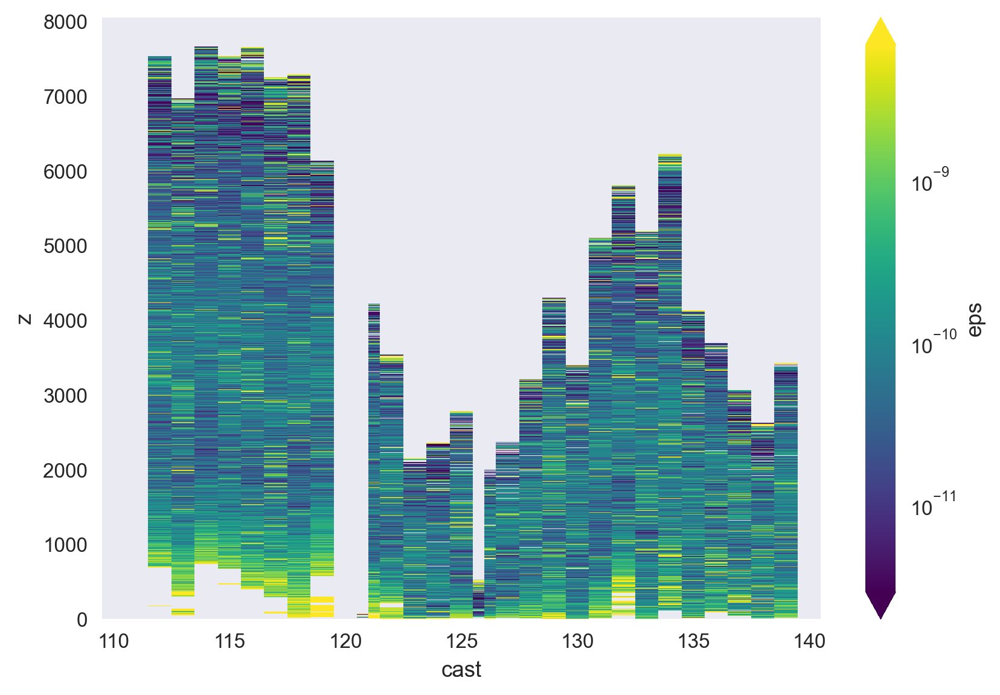

In [16]:
subset.eps.plot(y="z", robust=True, norm=mpl.colors.LogNorm())

### Process a single profile

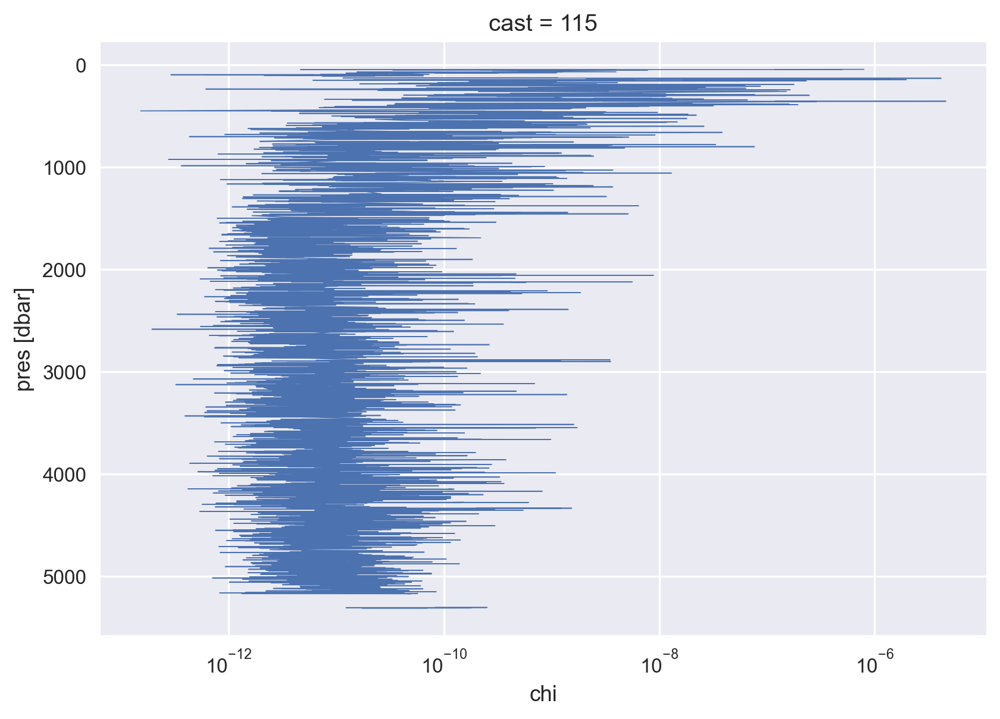

In [17]:
profile = ds.sel(cast=115).sortby("pres").query({"z": "pres > 0"})
plt.figure()
profile.chi.cf.plot(xscale="log", lw=0.5)

In [20]:
def process_segment(data, debug=False):
    """
    This function process one data bin and constructs many bootstrap estimates
    """
    # data = binned.isel(z=1250).chi
    boot = IIDBootstrap(data.data)

    # Empirically find top 0.6% of samples
    topk_estimates = boot.apply(
        topk_thresh, reps=1000, extra_kwargs={"thresh": 0.6}
    ).squeeze()
    # median of top 0.6% values
    median = np.median(topk_estimates)
    # top 20% of top 0.6% values
    top20 = np.sort(topk_estimates)[-int(np.ceil(20 / 100 * len(thresh_estimates)))]

    # GE threshold for the sample
    ge_thresh = (data.mean() + 2.698 * data.std()).data.item()
    # bootstrapped GE thresholds
    ge_estimates = boot.apply(ge_lognorm, reps=1000).squeeze()

    if debug:
        f, ax = plt.subplots(2, 1, constrained_layout=True)
        data.plot(yscale="log", ax=ax[0], marker="o", color="k", ms=5)

        ax[1].hist(np.log10(data), bins=41, density=False, label="data")
        ax[1].hist(
            np.log10(topk_estimates),
            density=True,
            histtype="step",
            lw=2,
            color="C4",
            label="boot topk",
        )
        ax[1].hist(
            np.log10(ge_estimates),
            density=True,
            histtype="step",
            lw=2,
            color="C3",
            label="boot ge",
        )
        ax[1].legend(bbox_to_anchor=(1, 1))

        for line, color, label in zip(
            [ge_thresh, np.median(ge_estimates), median, top20],
            ["C0", "C3", "C4", "C5"],
            ["GE sample", "median GE boot", "median boot", "top20 boot"],
        ):
            ax[0].axhline(line, color=color, label=label, zorder=-1)
            ax[1].axvline(np.log10(line), color=color, label=label)
        ax[0].legend(bbox_to_anchor=(1, 1))
        f.set_size_inches((8, 5))

    return (
        median,
        top20,
        ge_thresh,
        ge_estimates.mean(),
        np.median(ge_estimates),
    )


def find_thresholds(profile, binsize):
    """
    This function processes a single cast (profile) and estimates various
    thresholds for a given binsize
    """
    trimmed = profile.where(
        profile.chi.interpolate_na("z").notnull(), drop=True
    ).set_index(z="pres")
    starts = trimmed.z.sel(
        z=slice(binsize / 2, profile.z.max().data - binsize / 2)
    ).data
    stacked = np.stack([starts - binsize / 2, starts, starts + binsize / 2], axis=-1)

    thresholds = np.full((stacked.shape[0], 5), np.nan)
    for irow in tqdm.notebook.trange(5000):
        row = stacked[irow, :]
        start, center, stop = row
        segment = trimmed.sel(z=slice(start, stop))
        if segment.chi.count().item() < 10:
            continue
        thresholds[irow, :] = process_segment(segment.chi)

    return xr.DataArray(
        thresholds[:irow, :],
        dims=("z", "kind"),
        coords={
            "z": starts[:irow],
            "kind": [
                "median 0.6%",
                "top20 0.6%",
                "GE sample",
                "GE boot mean",
                "GE boot median",
            ],
        },
    )

In [21]:
th25 = find_thresholds(profile, binsize=25)
th50 = find_thresholds(profile, binsize=50)
th100 = find_thresholds(profile, binsize=100)
th200 = find_thresholds(profile, binsize=200)

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

In [23]:
thresholds = xr.concat([th25, th50, th100, th200], dim="binsize")
thresholds["binsize"] = [25, 50, 100, 200]
thresholds.to_netcdf("p06-cast-115-25dbar-50dbar-100dbar-200dbar.nc")

### Study thresholds for a single profile

Click on legend to turn things on and off.

Some notes

1. 25dbar bin seems a bit noisy; 50dbar and 100dbar seems very similar, 200dbar is a smoothed version of 100dbar
1. Using GE threshold using sample mean, std is basically identical to median of bootstrapped estimates of that value
1. For the parametric estimate, (median value) of the (lowest of top 0.6%) is lower than GE but the (lowest of top 20%) of (lowest of top 0.6%) is larger than both, and seems too high even.

In [50]:
thresholds = xr.load_dataarray("p06-cast-115-25dbar-50dbar-100dbar-200dbar.nc")
thresholds.name = "thresholds"

In [24]:
a = thresholds.drop_sel(kind="GE boot mean").hvplot(
    x="z",
    col="kind",
    by="binsize",
    ylim=(1e-12, 5e-6),
    logy=True,
    legend="bottom",
    frame_width=240,
    frame_height=200,
    line_width=1,
    muted_alpha=0,
)
a

:GridSpace   [kind]
   :NdOverlay   [binsize]
      :Curve   [z]   (value)

In [26]:
thresholds.drop_sel(kind="GE boot mean").hvplot.line(
    x="z",
    row="binsize",
    by="kind",
    ylim=(1e-12, 5e-6),
    logy=True,
    legend="bottom",
    frame_width=250,
    frame_height=200,
    line_width=1,
    muted_alpha=0,
)

:GridSpace   [binsize]
   :NdOverlay   [kind]
      :Curve   [z]   (value)

In [72]:
layout = thresholds.hvplot.line(
    subplots=True, x="z", by="kind", logy=True, legend="bottom"
)
print(layout)

:DynamicMap   [binsize]


In [82]:
layout

:Overlay
   .Curve.I     :Curve   [pres]   (chi)
   .NdOverlay.I :NdOverlay   [kind]
      :Curve   [z]   (thresholds)

In [96]:
import functools

chiplot = profile.chi.hvplot(
    x="pres",
    logy=True,
    frame_width=1000,
    frame_height=200,
    line_width=1,
    line_color="darkgray",
)

layouts = []
for b in thresholds.binsize.data[::-1]:
    layout = chiplot * thresholds.sel(binsize=b).hvplot(
        x="z", by="kind", legend="bottom"
    )
    layout.opts(title=f"binsize={b}dbar")
    layouts.append(layout)

(layouts[0] + layouts[1] + layouts[2] + layouts[3]).cols(1)

:Layout
   .Overlay.I   :Overlay
      .Curve.I     :Curve   [pres]   (chi)
      .NdOverlay.I :NdOverlay   [kind]
         :Curve   [z]   (thresholds)
   .Overlay.II  :Overlay
      .Curve.I     :Curve   [pres]   (chi)
      .NdOverlay.I :NdOverlay   [kind]
         :Curve   [z]   (thresholds)
   .Overlay.III :Overlay
      .Curve.I     :Curve   [pres]   (chi)
      .NdOverlay.I :NdOverlay   [kind]
         :Curve   [z]   (thresholds)
   .Overlay.IV  :Overlay
      .Curve.I     :Curve   [pres]   (chi)
      .NdOverlay.I :NdOverlay   [kind]
         :Curve   [z]   (thresholds)

## Attempt 1

In [ ]:
binned = (
    profiles.reset_coords("pres")
    .rolling(z=80, center=True)
    .construct("bin")
    .set_coords("pres")
)

OK OK these are not uniformly spaced but close enough?

In [ ]:
(binned.pres.max("bin") - binned.pres.min("bin")).plot()

In [ ]:
process_segment(binned.isel(z=1250).chi, debug=True)